# 1. Import modules and load MERFISH data 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

# 2. Load MERLin analysis results

In [3]:
merlin_output_folder = r'I:\MERFISH_Analysis\Cellpose\20220208-P_brain_M1_nonclear'
# generate post-analysis folders
#postanalysis_folder = merlin_output_folder+'_PostAnalysis'
postanalysis_folder = r'\\mendel\Mendel_SSD1\Pu_Temp\20220208MO4_nonclear'
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Create postanalysis_folder: \\mendel\Mendel_SSD1\Pu_Temp\20220208MO4_nonclear


In [4]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,103641256736078854362335905444101517866,0,456.326380,-2442.703996,1094.180027,-2447.790797,-2437.617196,1089.201227,1099.158827
1,103997814873698514415264233834720967331,0,1832.677868,-2450.857997,1137.218028,-2459.238797,-2442.477196,1124.733228,1149.702829
2,106718484757835434472919423959947061388,0,264.613134,-2464.735997,1132.304028,-2467.662797,-2461.809197,1126.677228,1137.930828
3,109178939449449152210141064274607887980,0,146.165207,-2467.651997,1122.422028,-2470.686797,-2464.617197,1118.469228,1126.374828
4,117005809098667320407798487994161473261,0,516.200728,-2369.533995,986.833425,-2378.454795,-2360.613194,982.400024,991.266825
...,...,...,...,...,...,...,...,...,...
18987,93204673511625412823579055804861268037,162,160.019008,5460.276199,-984.919949,5456.377399,5464.174999,-988.710749,-981.129149
18988,95741273838896175969059283691213347291,162,541.104535,5492.946200,-1001.227950,5484.565400,5501.327000,-1007.718750,-994.737150
18989,95891862418591609038671701055114620893,162,283.191437,5514.384200,-985.189949,5509.945400,5518.823000,-989.034749,-981.345149
18990,96656407512209176434513938811993122388,162,1114.627411,5383.866197,-863.041946,5377.753397,5389.978997,-870.558746,-855.525146


In [5]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')
#blanks = [f'Blank-{i}' for i in range(1, 11)]
for _c in df.columns:
    if 'Blank-' in _c:
        df = df.drop(columns=_c)
adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

In [6]:
df

,1700022I11Rik,1810046K07Rik,5031425F14Rik,5730522E02Rik,Acta2,Adam2,Adamts2,Adamts4,Adra1b,Alk,...,Unc13c,Unc5b,Unc5d,Ust,Vipr2,Vtn,Vwc2,Wipf3,Wnt7b,Zfp804b
index,,,,,,,,,,,,,,,,,,,,,
103641256736078854362335905444101517866,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
103997814873698514415264233834720967331,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
106718484757835434472919423959947061388,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109178939449449152210141064274607887980,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
117005809098667320407798487994161473261,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93204673511625412823579055804861268037,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
95741273838896175969059283691213347291,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0
95891862418591609038671701055114620893,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [7]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

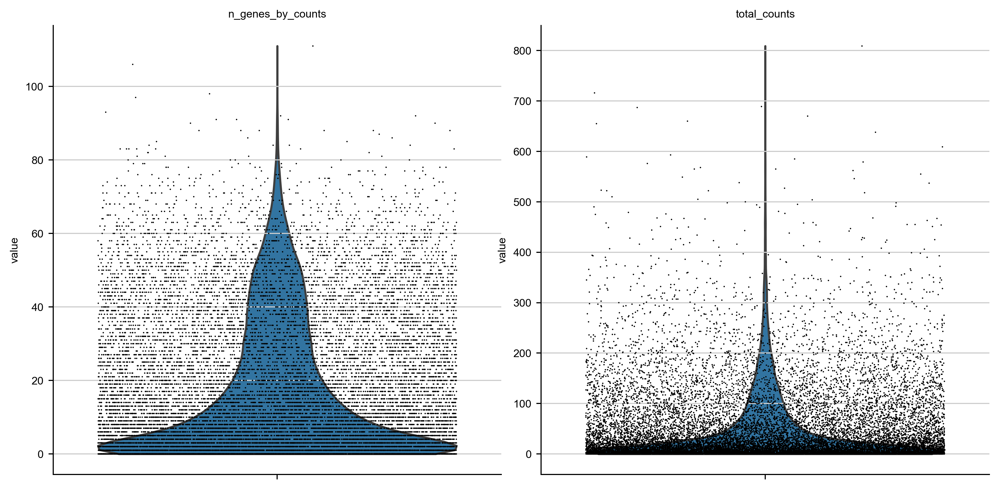

In [8]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

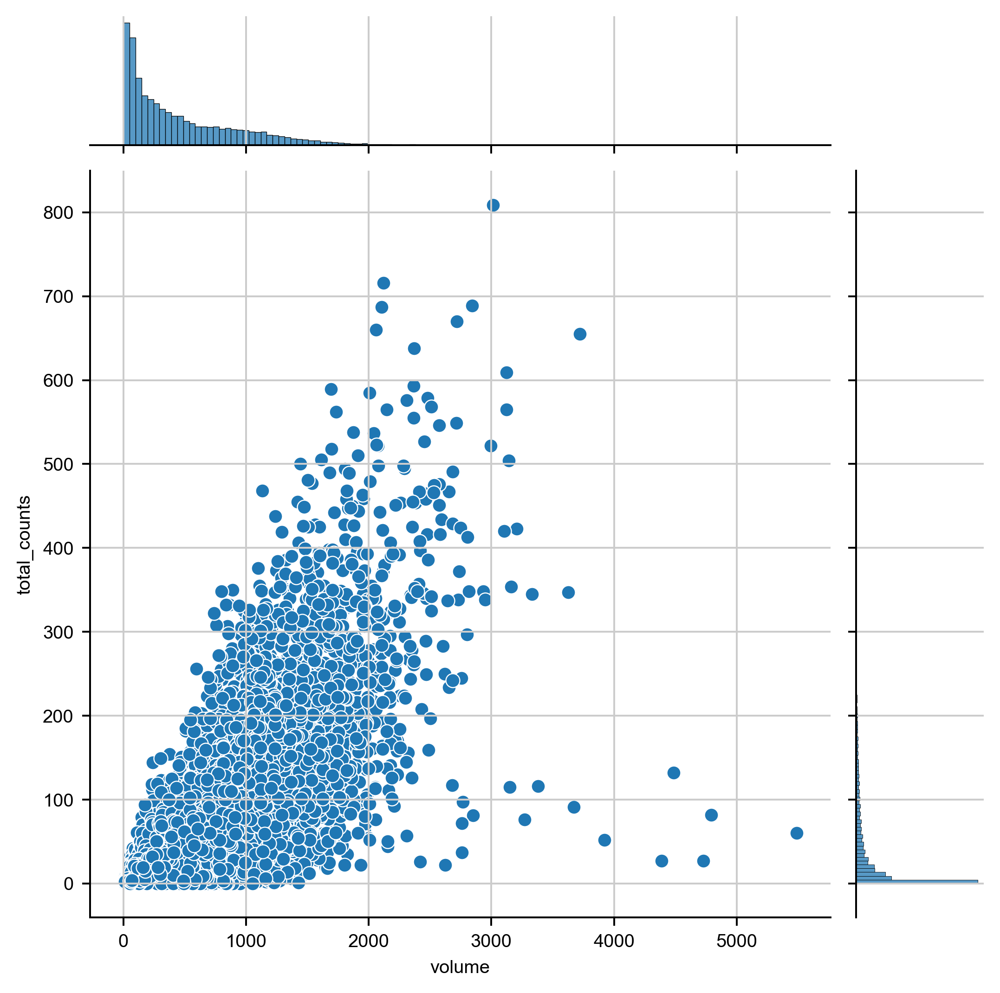

In [9]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts')

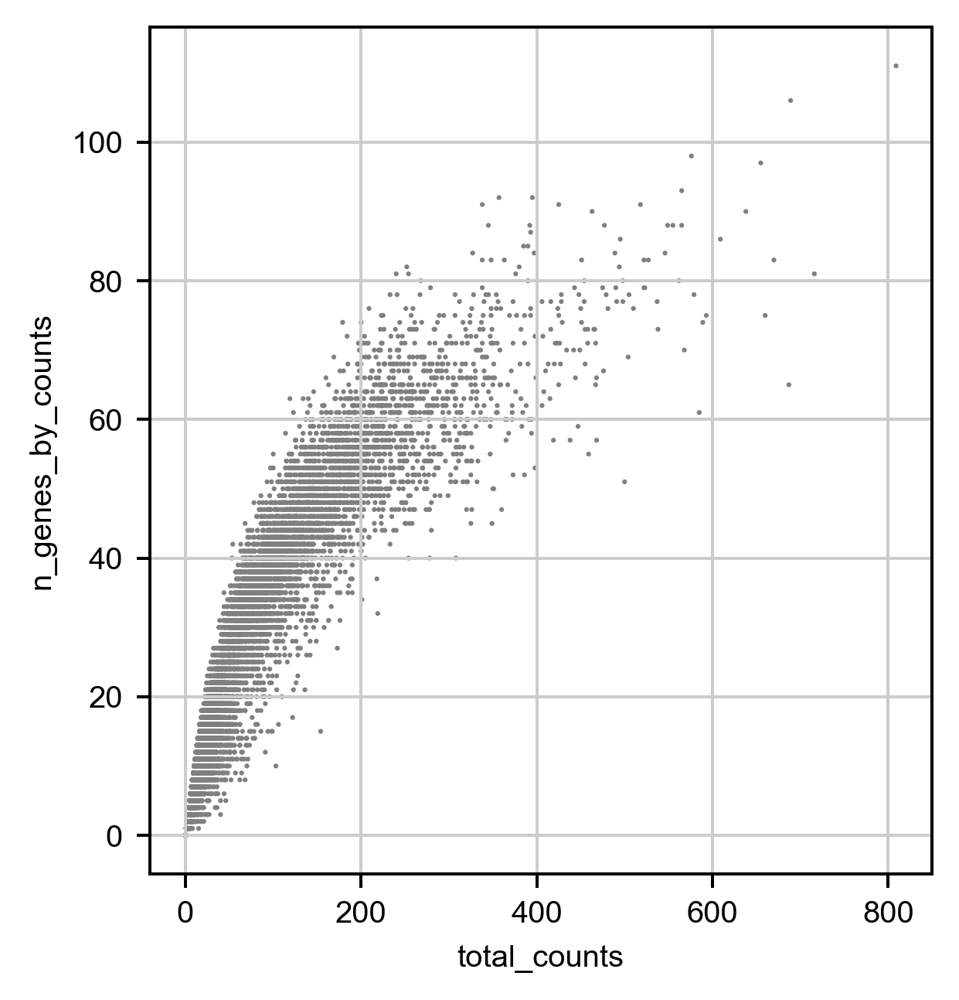

In [10]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [11]:
adata = adata[adata.obs['total_counts'] > 10]
adata = adata[adata.obs['n_genes_by_counts'] > 5]
adata = adata[adata.obs['volume'] > 100]

print(len(adata))

10504


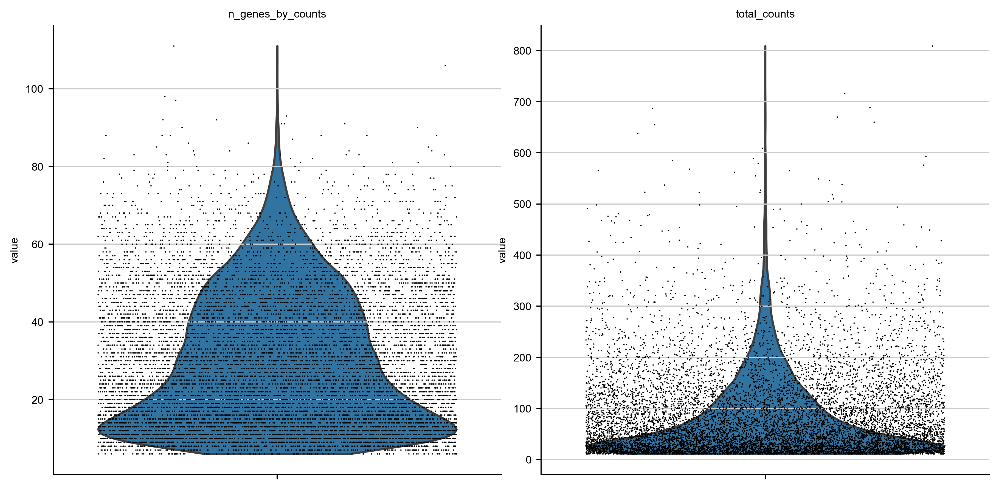

In [12]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [13]:
max(adata.obs['total_counts'])

809.0

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


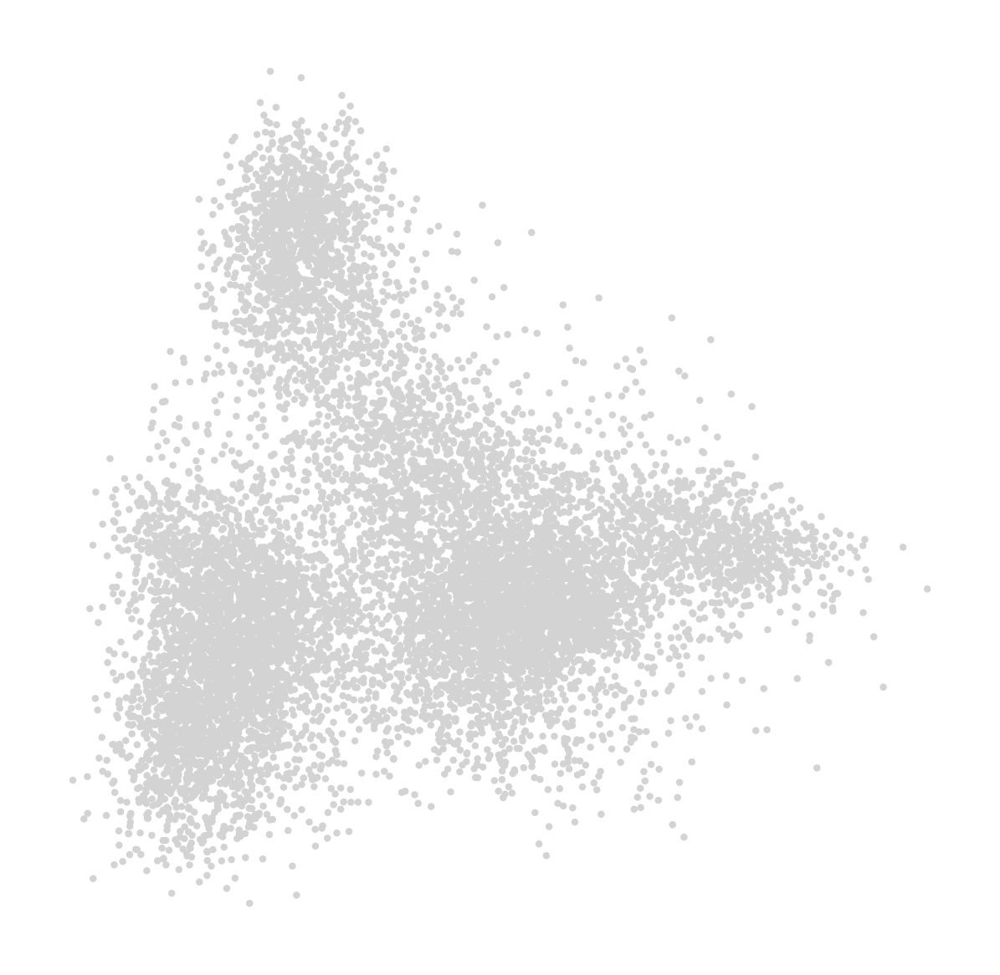

Wall time: 1min 14s


In [14]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [15]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

Wall time: 56.2 s


In [16]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=1)

Wall time: 2.85 s


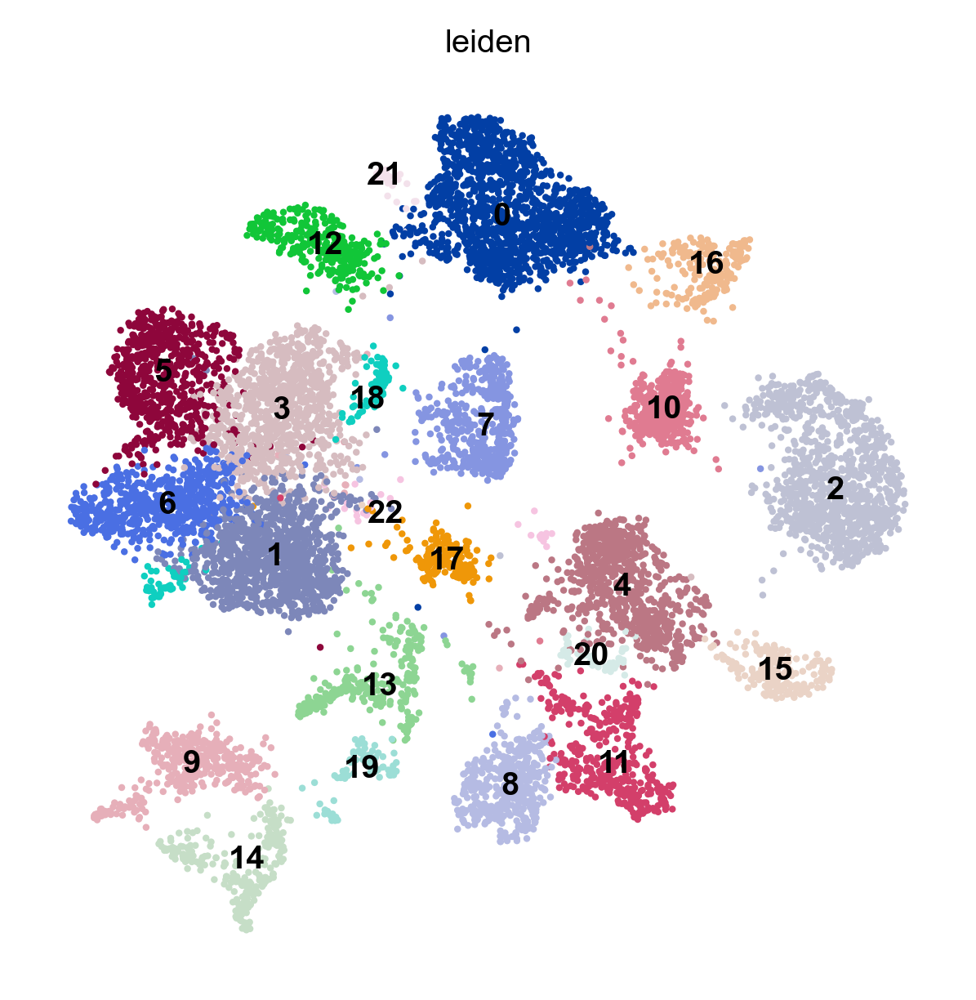

Wall time: 4min 31s


In [17]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

(-3109.1417513305323, 5990.447708159872, -1489.122248709388, 3872.76830327902)

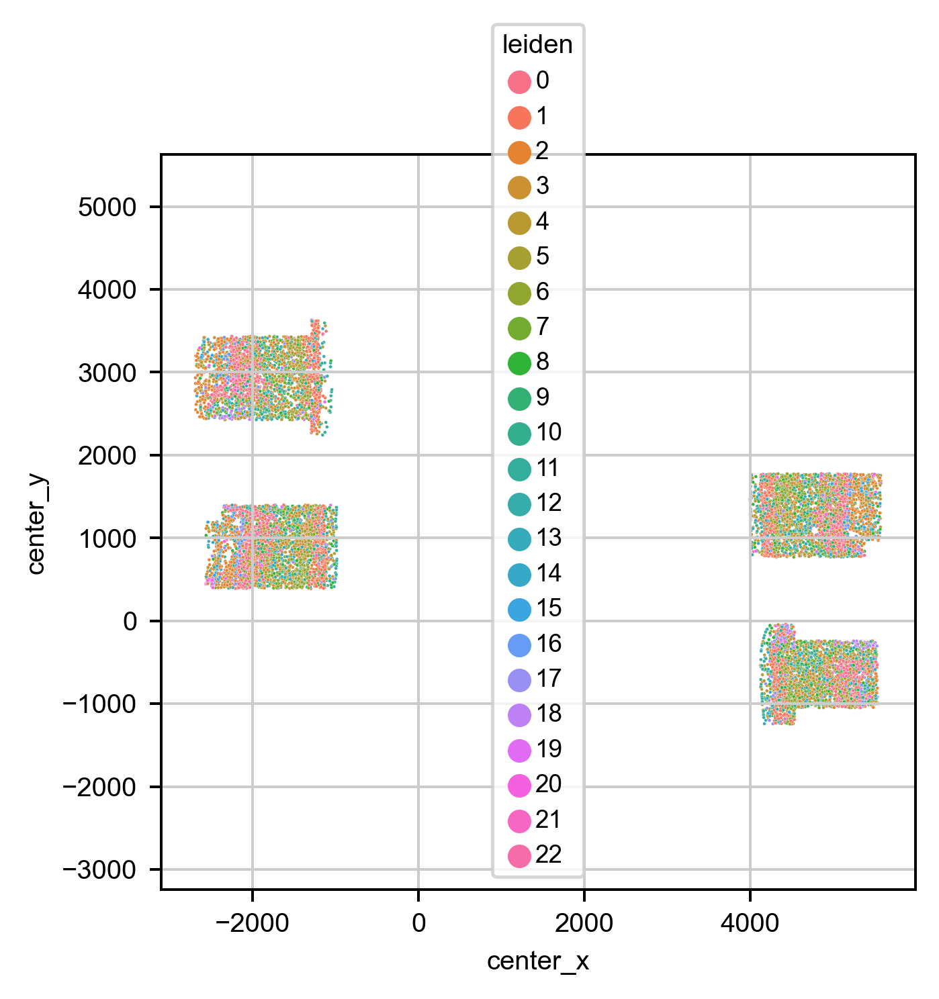

In [18]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
sns.scatterplot(data=adata.obs, x='center_x', y='center_y', hue='leiden', s=1)
plt.axis('equal')

(-3109.1417513305323, 5990.447708159872, -1489.122248709388, 3872.76830327902)

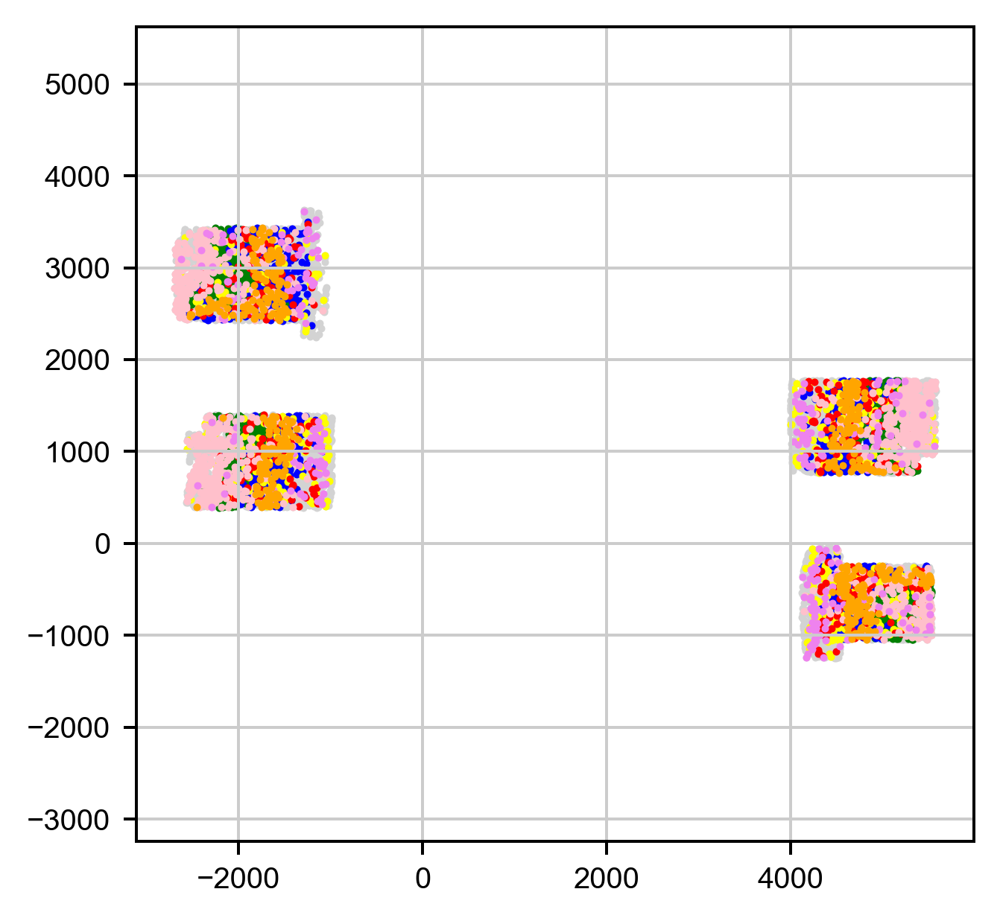

In [19]:
# can also plot a subset of clusters using their "leiden #"
import matplotlib.pyplot as plt

plt.scatter(adata.obs['center_x'], adata.obs['center_y'], c='lightgrey', s=1)


df = adata.obs[adata.obs['leiden'] == '0']
plt.scatter(df['center_x'], df['center_y'], c='green', s=1) 

df = adata.obs[adata.obs['leiden'] == '3']
plt.scatter(df['center_x'], df['center_y'], c='blue', s=1) 

#df = adata.obs[adata.obs['leiden'] == '15']
#plt.scatter(df['center_x'], df['center_y'], c='green', s=1) 


df = adata.obs[adata.obs['leiden'] == '8']
plt.scatter(df['center_x'], df['center_y'], c='yellow', s=1) 


df = adata.obs[adata.obs['leiden'] == '9'] 
plt.scatter(df['center_x'], df['center_y'], c='red', s=1)   


df = adata.obs[adata.obs['leiden'] == '2']
plt.scatter(df['center_x'], df['center_y'], c='pink', s=1) 


df = adata.obs[adata.obs['leiden'] == '13']
plt.scatter(df['center_x'], df['center_y'], c='violet', s=1) 


df = adata.obs[adata.obs['leiden'] == '7']
plt.scatter(df['center_x'], df['center_y'], c='orange', s=1) 


plt.axis('equal')

## 5. Check count for each cell for genes of interest

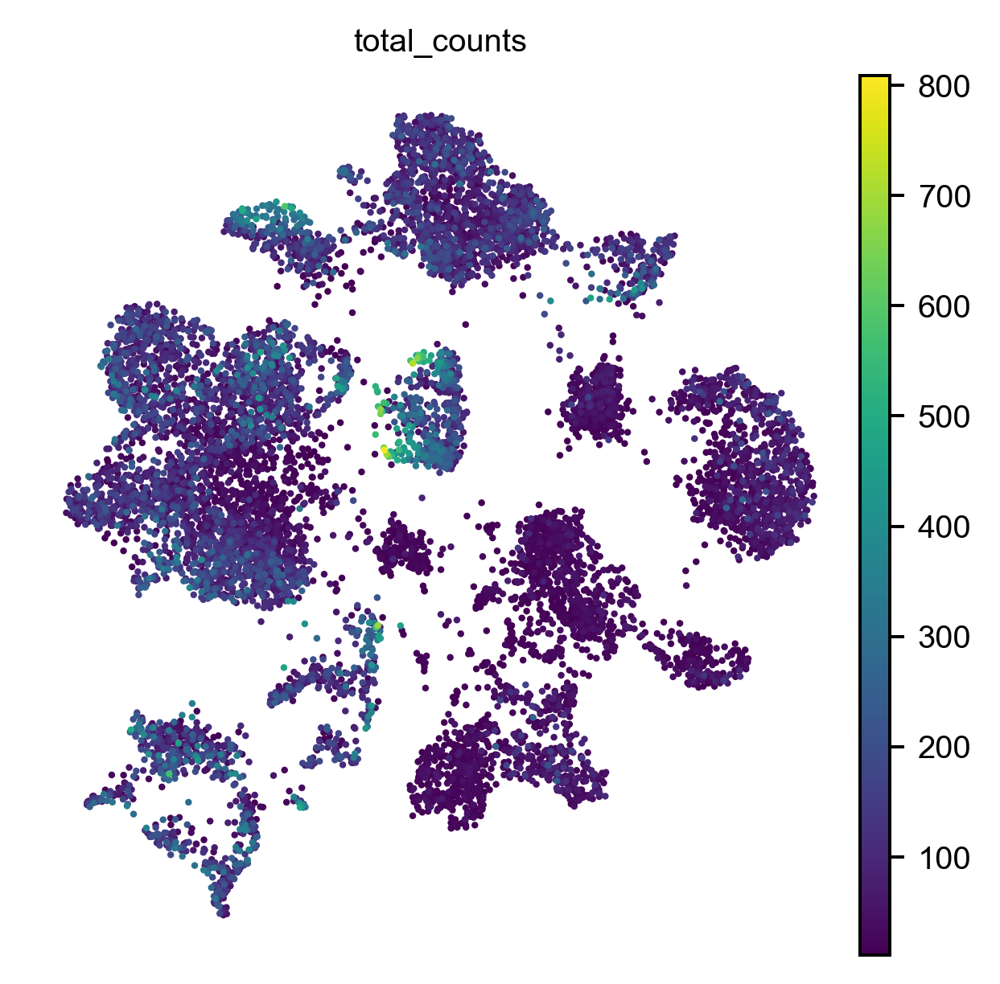

In [20]:
sc.pl.umap(adata, color='total_counts')

In [21]:
# load gene names
sel_gene_df = pd.read_excel(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-12_mop_markers\smFISH_cell_class\MOP_marker_gene_readout.xlsx',
                          )
marker_genes = [_g for _g in sel_gene_df['Target gene'].values if (_g in adata.var.index)]
print(marker_genes)

['Slc30a3', 'Slc32a1', 'Otof', 'Rspo1', 'Sncg', 'Fam84b', 'Tshz2', 'Syt6', 'Nxph4', 'Cux2', 'Rorb', 'Sulf2', 'Ptpru', 'Car3', 'Aqp4', 'Flt1', 'Igf2', 'Pdgfra', 'Sox10', 'Ctss', 'Vtn', 'Bgn']


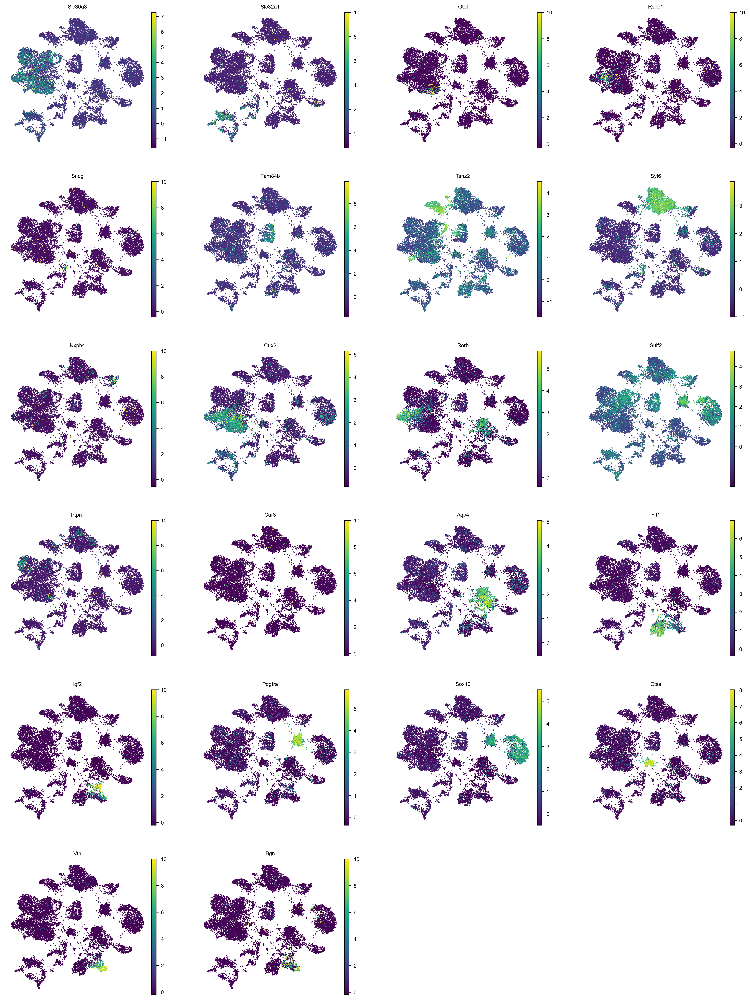

In [22]:
sc.pl.umap(adata, color=marker_genes)

## 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

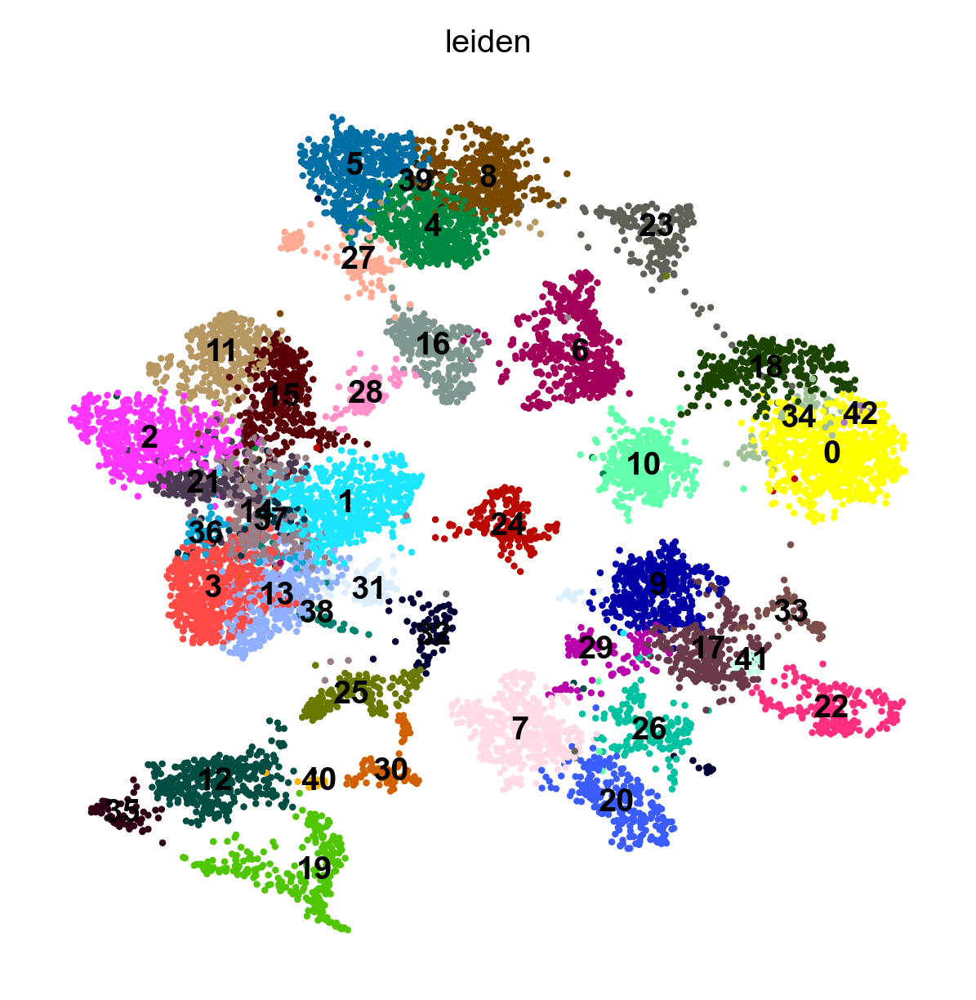

Wall time: 4min 15s


In [23]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=50)

sc.tl.leiden(adata, resolution=2)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this labels as a new column as 'leiden_cluster'
adata.obs['leiden_cluster'] = adata.obs.leiden

## 6.2 Use lower expected pcs and resolution to UMAP for cell-type distinction at subclass level

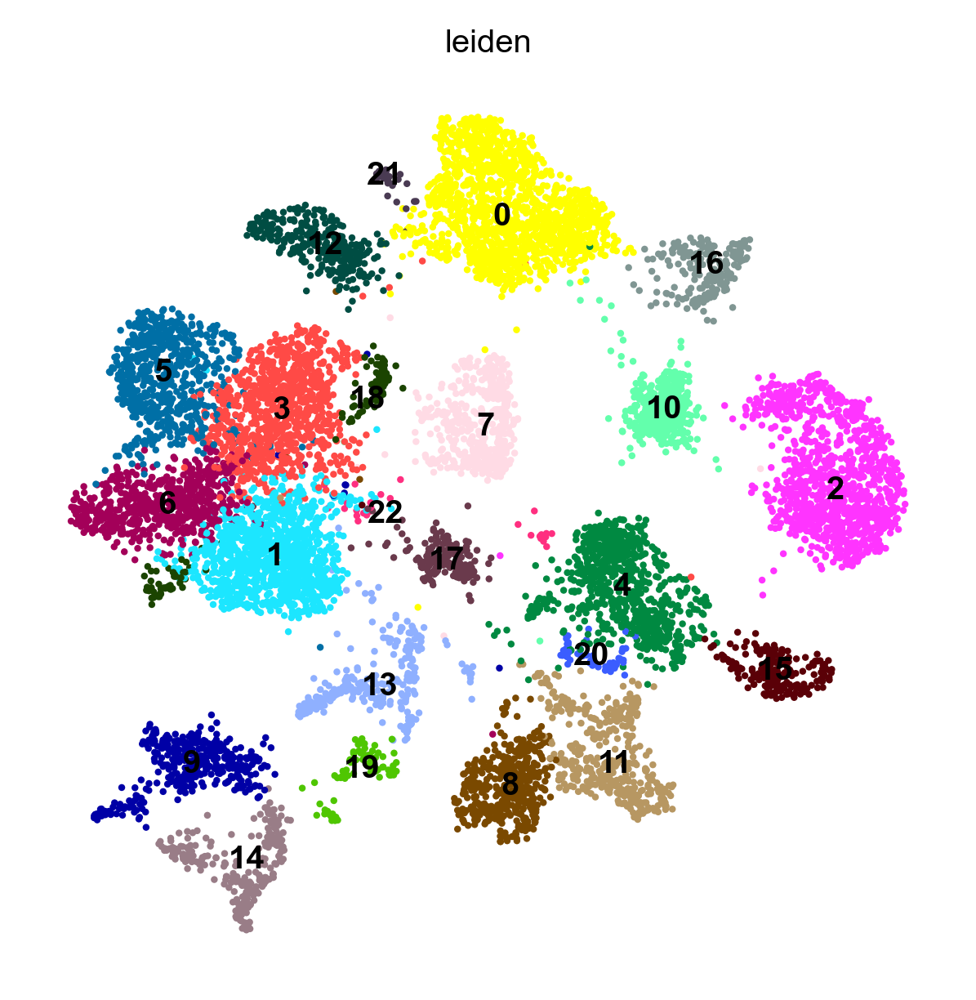

Wall time: 3min 43s


In [24]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

sc.tl.leiden(adata, resolution=1)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this new labels as a new column as 'leiden_subclass'
adata.obs['leiden_subclass'] = adata.obs.leiden

## 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [25]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = False

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: \\mendel\Mendel_SSD1\Pu_Temp\20220208MO4_nonclear\filtered_cluster_data.h5ad
